# Visão Computacional e Deep Learning para Sensoriamento Remoto com Python


# Capítulo 19 - Arquiteturas de Detecção de Objetos One Stage

## Arquiteturas One Stage

Agora vamos nos concentrar em arquiteturas de modelo que prevêem diretamente caixas delimitadoras de objetos para uma imagem em um estágio. Em outras palavras, não há nenhuma tarefa intermediária (como vimos na aula passada com propostas de região) que deve ser executada para produzir um resultado. Isso leva a uma arquitetura de modelo mais simples e rápida, embora às vezes possa ser difícil ser flexível o suficiente para se adaptar a tarefas arbitrárias (como previsão de máscara).

## SSD - Single Shot Detection

SSD é projetado para detecção de objetos em tempo real. O Faster R-CNN usa uma rede de proposta de região para criar caixas de limite e utiliza essas caixas para classificar objetos. Embora seja considerado o início da arte em precisão, todo o processo é executado a 7 quadros por segundo. Muito abaixo do que o processamento em tempo real precisa. O SSD acelera o processo eliminando a necessidade da rede proposta por região. Para recuperar a queda na precisão, o SSD aplica algumas melhorias, incluindo recursos multiescala e caixas padrão. Essas melhorias permitem que o SSD corresponda à precisão do Faster R-CNN usando imagens de resolução mais baixa, o que aumenta ainda mais a velocidade.

O SSD tem dois componentes: um modelo de backbone e um cabeçote de SSD. O modelo de backbone geralmente é uma rede de classificação de imagem pré-treinada como um extrator de recursos. Isso é tipicamente uma rede como ResNet treinada em ImageNet da qual a camada de classificação final totalmente conectada foi removida. Ficamos, portanto, com uma rede neural profunda que é capaz de extrair significado semântico da imagem de entrada, preservando a estrutura espacial da imagem, embora com uma resolução mais baixa. Para ResNet34, o backbone resulta em 256 mapas de recursos 7x7 para uma imagem de entrada. Explicaremos o que são feições e mapas de feições mais adiante. A cabeça do SSD é apenas uma ou mais camadas convolucionais adicionadas a esse backbone e as saídas são interpretadas como caixas delimitadoras e classes de objetos na localização espacial das ativações das camadas finais.



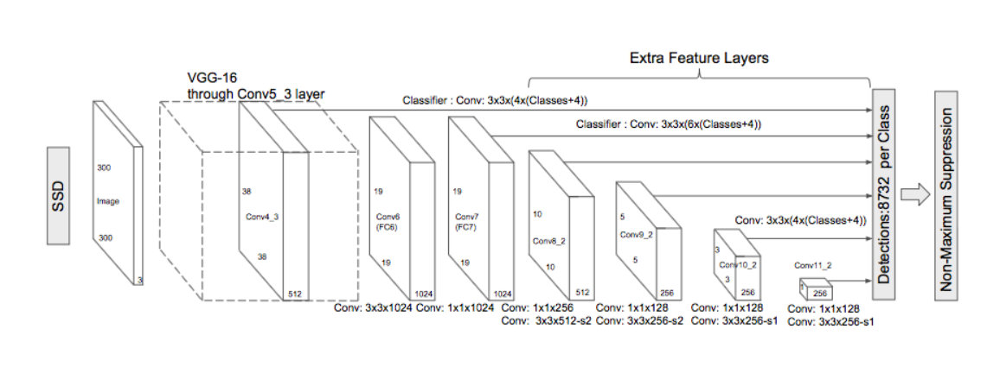

### Grid cell

Em vez de usar janela deslizante, o SSD divide a imagem usando uma grade e faz com que cada célula da grade seja responsável por detectar objetos naquela região da imagem. A detecção de objetos significa simplesmente prever a classe e a localização de um objeto nessa região. Se nenhum objeto estiver presente, nós o consideramos como a classe de fundo e a localização é ignorada. Por exemplo, poderíamos usar uma grade 4x4 no exemplo abaixo. Cada célula da grade é capaz de exibir a posição e a forma do objeto que ela contém.


  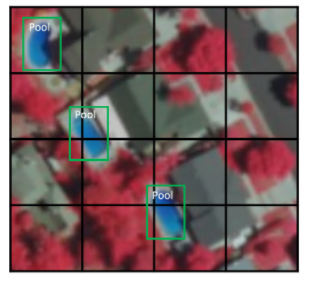

Agora você pode estar se perguntando e se houver vários objetos em uma célula de grade ou se precisarmos detectar vários objetos de diferentes formas. É aí que a caixa âncora e o campo receptivo entram em ação.

### Anchor box

Cada célula da grade no SSD pode ser atribuída com várias caixas âncora/anteriores. Essas caixas âncora são pré-definidas e cada uma é responsável por um tamanho e forma dentro de uma célula da grade. Por exemplo, a piscina na imagem abaixo corresponde à caixa de ancoragem mais alta enquanto o edifício corresponde à caixa mais larga.

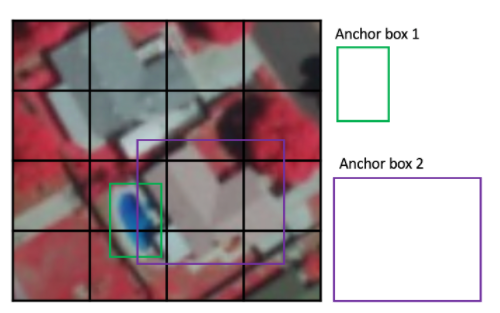

#### O que são Caixas Âncora?


Para prever e localizar muitos objetos diferentes em uma imagem, a maioria dos modelos de detecção de objetos de última geração, como o EfficientDet e os modelos YOLO, começam com caixas de ancoragem como prioridade e se ajustam a partir daí.

Os modelos de última geração geralmente usam caixas delimitadoras na seguinte ordem:

- Forme milhares de caixas âncora candidatas ao redor da imagem
- Para cada caixa âncora, preveja algum deslocamento dessa caixa como uma caixa candidata
- Calcule uma função de perda com base no exemplo da verdade básica
- Calcular a probabilidade de que uma determinada caixa de deslocamento se sobreponha a um objeto real
- Se essa probabilidade for maior que 0,5, fatore a previsão na função de perda
- Ao recompensar e penalizar as caixas previstas, puxe lentamente o modelo para apenas localizar objetos verdadeiros
- É por isso que, quando você treinou levemente um modelo, verá caixas previstas aparecendo em todos os lugares.

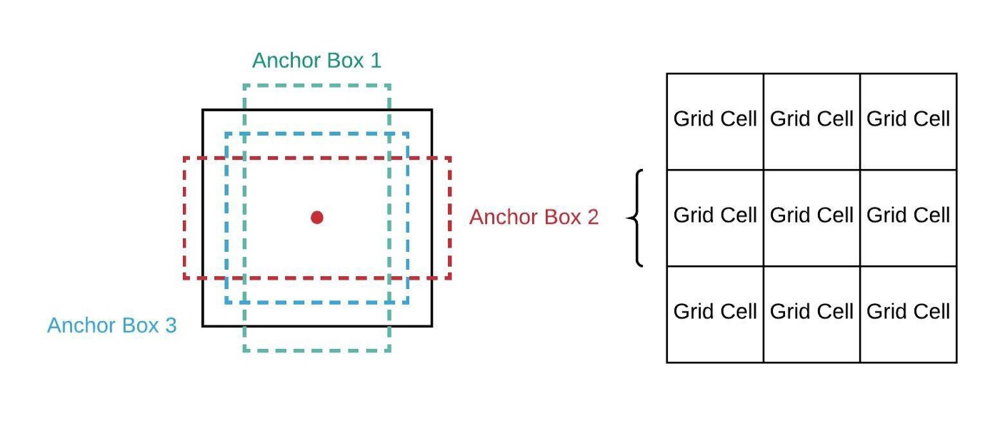

O SSD usa uma fase de correspondência durante o treinamento para combinar a caixa de âncora apropriada com as caixas delimitadoras de cada objeto de verdade em uma imagem. Essencialmente, a caixa de ancoragem com o maior grau de sobreposição com um objeto é responsável por prever a classe desse objeto e sua localização. Esta propriedade é usada para treinar a rede e para prever os objetos detectados e suas localizações uma vez que a rede tenha sido treinada. Na prática, cada caixa de âncora é especificada por uma proporção e um nível de zoom.

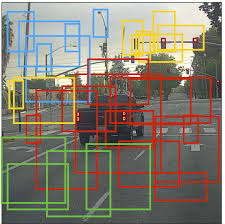

### Aspect ratio

Nem todos os objetos são quadrados. Algumas são mais longas e outras mais largas, em graus variados. A arquitetura SSD permite proporções pré-definidas das caixas de âncora para levar em conta isso. O parâmetro de proporções pode ser usado para especificar as diferentes proporções das caixas âncora associadas a cada célula da grade em cada nível de zoom/escala.

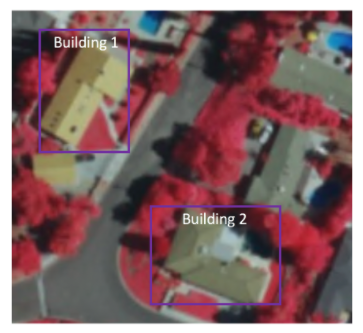

### Zoom level

Não é necessário que as caixas de ancoragem tenham o mesmo tamanho da célula da grade. Podemos estar interessados em encontrar objetos menores ou maiores dentro de uma célula da grade. O parâmetro zooms é usado para especificar o quanto as caixas âncora precisam ser dimensionadas para cima ou para baixo em relação a cada célula da grade. Assim como vimos no exemplo da caixa de ancoragem, o tamanho do prédio geralmente é maior do que a piscina.

### Receptive Field

O campo receptivo é definido como a região no espaço de entrada para a qual um recurso específico da CNN está olhando (ou seja, é afetado por). Usaremos "recurso" e "ativação" de forma intercambiável aqui e os trataremos como a combinação linear (às vezes aplicando uma função de ativação depois disso para aumentar a não linearidade) da camada anterior no local correspondente. Por causa da operação de convolução, feições em diferentes camadas representam diferentes tamanhos de região na imagem de entrada. À medida que se aprofunda, o tamanho representado por um recurso aumenta. Neste exemplo abaixo, começamos com a camada inferior (5x5) e então aplicamos uma convolução que resulta na camada intermediária (3x3) onde uma feição (pixel verde) representa uma região 3x3 da camada de entrada (camada inferior). Em seguida, aplique a convolução à camada do meio e obtenha a camada superior (2x2), onde cada recurso corresponde a uma região de 7x7 na imagem de entrada. Esse tipo de matriz 2D verde e laranja também é chamada de mapas de recursos, que se referem a um conjunto de recursos criados pela aplicação do mesmo extrator de recursos em diferentes locais do mapa de entrada em uma janela deslizante. As feições no mesmo mapa de feições têm o mesmo campo receptivo e procuram o mesmo padrão, mas em locais diferentes. Isso cria a invariância espacial de ConvNet.

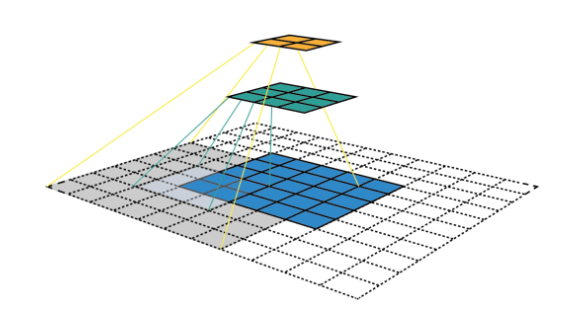

O campo receptivo é a premissa central da arquitetura SSD, pois nos permite detectar objetos em diferentes escalas e produzir uma caixa delimitadora mais restrita. Porque? Como você ainda deve se lembrar, o backbone ResNet34 gera 256 mapas de recursos 7x7 para uma imagem de entrada. Se especificarmos uma grade 4x4, a abordagem mais simples é apenas aplicar uma convolução a este mapa de recursos e convertê-lo em 4x4. Essa abordagem pode realmente funcionar até certo ponto e é exatamente a ideia de YOLO (You Only Look Once). A etapa extra realizada pelo SSD é que ele aplica mais camadas de convolução ao mapa de recursos do backbone e faz com que cada uma dessas camadas de convolução produza resultados de detecção de objeto. Como as camadas anteriores com campo receptivo menor podem representar objetos de tamanho menor, as previsões das camadas anteriores ajudam a lidar com objetos de tamanho menor.

Por causa disso, o SSD nos permite definir uma hierarquia de células de grade em diferentes camadas. Por exemplo, poderíamos usar uma grade 4x4 para encontrar objetos menores, uma grade 2x2 para encontrar objetos de tamanho médio e uma grade 1x1 para encontrar objetos que cobrem toda a imagem.

## Família YOLO

Em 2015, uma família de redes neurais foi proposta com a abreviatura YOLO em referência à notável frase “You only live once”. Isso se baseia no simples fato de que a rede só dá “uma olhada” ou uma passagem pela rede antes de produzir a imagem final. Isso permite a detecção de objetos com imagens em tempo real, o que é consideravelmente preferível para aplicativos relacionados à vigilância. A precisão dos objetos detectados é menor do que os modelos mencionados anteriormente devido à sua velocidade excepcional, mas mesmo assim consegue ser um concorrente de topo entre os demais.

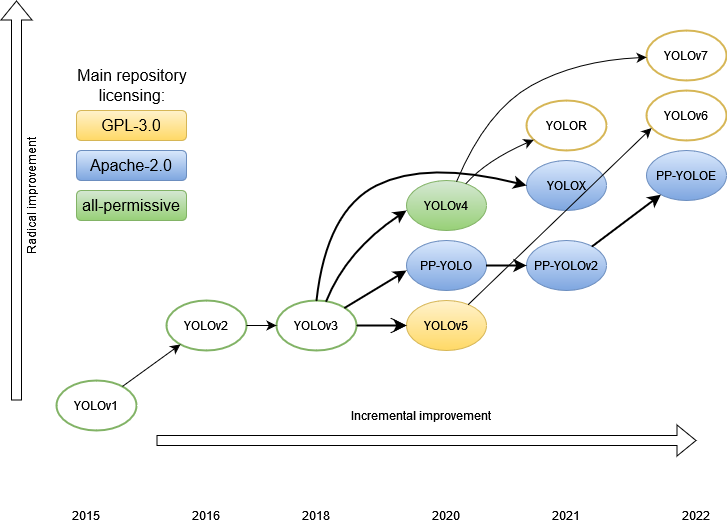

## YOLO v1

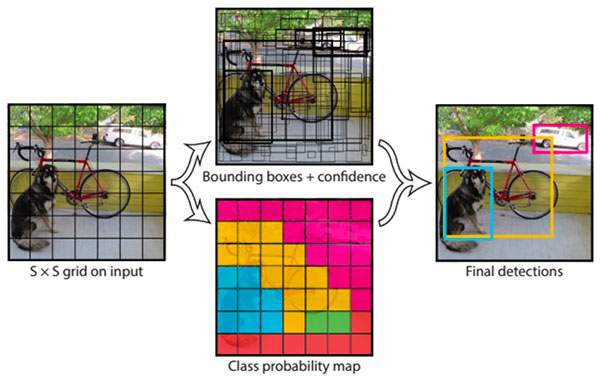

Antes da invenção do YOLO, os detectores de objetos CNNs, como o R-CNN, usavam Redes de Propostas de Região (RPNs) primeiro para gerar propostas de caixas delimitadoras na imagem de entrada, depois executavam um classificador nas caixas delimitadoras e, finalmente, aplicavam o pós-processamento para eliminar detecções duplicadas como bem como refinar as caixas delimitadoras. Os estágios individuais da rede R-CNN tiveram que ser treinados separadamente. A rede R-CNN era difícil de otimizar e também lenta.

Os criadores do YOLO foram motivados a projetar uma CNN de estágio único que pudesse ser treinada de ponta a ponta, fosse fácil de otimizar e funcionasse em tempo real.

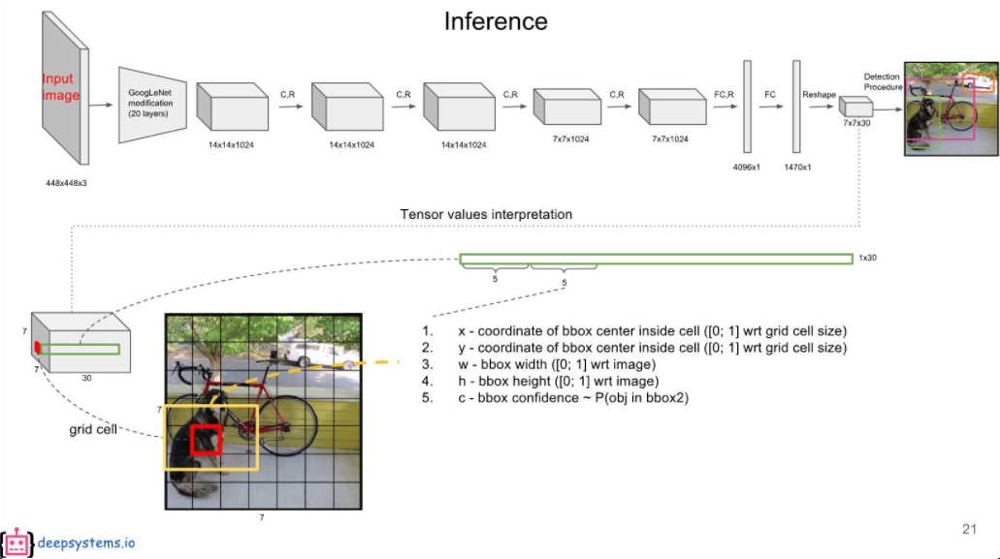

Conforme mostrado, YOLO divide a imagem de entrada em células de grade S x S. Conforme mostrado na imagem central da figura, cada célula da grade prevê B caixas delimitadoras e uma pontuação de “objetividade” P (Objeto) indicando se a célula da grade contém um objeto ou não. Cada célula da grade também prevê a probabilidade condicional P (Classe | Objeto) da classe à qual pertence o objeto contido na célula da grade.

Para cada caixa delimitadora, o YOLO prevê cinco parâmetros – x, y, w, h e uma pontuação de confiança. O centro da caixa delimitadora em relação à célula da grade é indicado pelas coordenadas (x,y). Os valores de xey são limitados entre 0 e 1. A largura w e a altura h da caixa delimitadora são previstas como uma fração da largura e altura de toda a imagem. Portanto, seus valores estão entre 0 e 1. A pontuação de confiança indica se a caixa delimitadora possui um objeto e quão precisa é a caixa delimitadora. Se a caixa delimitadora não tiver um objeto, a pontuação de confiança será zero. Se a caixa delimitadora tiver um objeto, a pontuação de confiança será igual à Interseção sobre União (IoU) da caixa delimitadora prevista e da verdade básica. Assim, para cada célula da grade, YOLO prevê parâmetros B x 5.

Para cada célula da grade, YOLO prevê probabilidades de classe C. Essas probabilidades de classe são condicionais com base em um objeto existente na célula da grade. YOLO prevê apenas um conjunto de probabilidades de classe C por célula da grade, mesmo que a célula da grade tenha B caixas delimitadoras. Assim, para cada célula da grade, YOLO prevê parâmetros C + B x 5.

Tensor de predição total para uma imagem = S x S x (C + B x 5). Para o conjunto de dados PASCAL VOC, YOLO usa S = 7, B = 2 e C = 20. Assim, a previsão YOLO final para PASCAL VOC é um tensor 7 x 7 x (20 + 5 x 2) = 7 x 7 x 30.

Finalmente, a versão 1 do YOLO aplica supressão não máxima (NMS) e limite para relatar as previsões finais, conforme mostrado na figura, imagem à direita.

### CNN Design

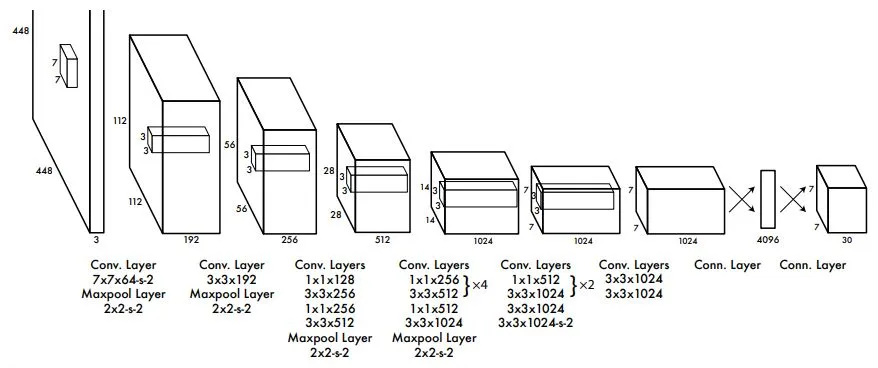

YOLO versão 1 CNN é mostrada na figura acima. Possui 24 camadas de convolução que atuam como um extrator de recursos. Eles são seguidos por 2 camadas totalmente conectadas que são responsáveis pela classificação dos objetos e regressão das caixas delimitadoras. A saída final é um tensor 7 x 7 x 30. YOLO CNN é uma CNN simples de caminho único semelhante ao VGG19. YOLO usa convoluções 1x1 seguidas de convoluções 3x3 com inspiração na versão 1 do Inception CNN do Google. A ativação Leaky ReLU é usada para todas as camadas, exceto a camada final. A camada final usa uma função de ativação linear.

### Resultados

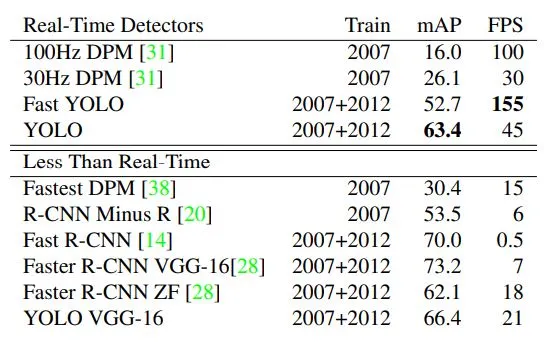

Os resultados do YOLO v1 no conjunto de dados PASCAL VOC 2007 estão listados acima. O YOLO atinge 45 FPS e 63,4% de mAP, que são significativamente mais altos em comparação com o DPM - outro detector de objetos em tempo real. Embora o Faster R-CNN VGG-16 tenha um mAP muito maior em 73,2%, sua velocidade é consideravelmente mais lenta em 7 FPS.

### Limitações

- O YOLO tem dificuldade em detectar pequenos objetos que aparecem em grupos.
- O YOLO tem dificuldades em detectar objetos com proporções incomuns.
- YOLO comete mais erros de localização em comparação com Fast R-CNN.

## YOLO v2

Há muitas modificações introduzidas pelos autores, mas espero que você esteja familiarizado com o YOLO v1, pois ajudará a entender o YOLO v2 de maneira muito mais rápida, melhor e mais forte.

### Melhor

Os autores afirmam que o YOLO v1 comete muito mais erros de localização em comparação com o Fast-RCNN e também tem um recall relativamente baixo. Portanto, para resolver os problemas acima, introduzem as seguintes modificações:

#### Batch Normalization:

As camadas BN são introduzidas após cada camada de convolução no YOLO v1, devido às quais os autores obtiveram cerca de 2% de melhoria em termos de mAP

#### Classificador de alta resolução

YOLO v1 treina o classificador com resolução de imagem de 224 × 224 e aumenta até 448 para detecção. No entanto, o YOLO v2 primeiro ajusta seu classificador diretamente para resolução de 448 × 448 por 10 épocas no ImageNet antes de começar a treinar a rede para detecção. Isso resultou em uma melhoria de 4% em termos de mAP.

#### Convolucional com caixas de âncora

Os autores removeram as camadas totalmente conectadas do YOLO v1 e usaram caixas de âncora para prever as caixas delimitadoras. Além disso, eles removeram uma camada de pooling e alteraram a resolução de entrada para 416 imagens de entrada em vez de 448×448. Isso é feito porque eles precisam de um número ímpar de locais em nosso mapa de características para que haja uma única célula central. Como resultado obtiveram uma pequena diminuição no desempenho em termos de mAP, mas uma boa melhoria em termos de recall, que é de aproximadamente 7%.

#### Clusters de dimensão

Existem dois problemas com caixas de ancoragem ao usá-las com YOLO. Primeiro, precisamos escolher bons antecedentes, ou seja, caixas de âncora, para a rede começar, para que seja mais fácil para a rede aprender. Portanto, os autores empregam agrupamento K-Means nas caixas delimitadoras do conjunto de treinamento.

a) Eles escolheram a função de distância da seguinte forma: d(caixa, centróide) = 1 − IOU(caixa, centróide).

b) Eles executaram K-Means com vários valores de k e descobriram que k = 5 oferece uma boa compensação entre complexidade do modelo e alto recall.

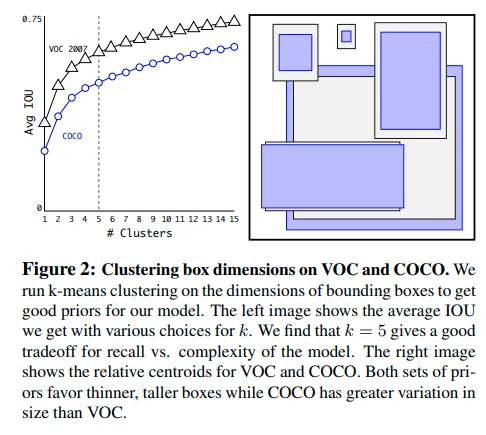

#### Treinamento Multiescala

Em vez de fixar o tamanho da imagem de entrada, a rede escolhe aleatoriamente uma resolução de entrada diferente, a cada 10 épocas, dos seguintes múltiplos de 32: {320, 352,…, 608}. Este regime incentiva a rede a ter um bom desempenho com uma variedade de dimensões de entrada. Além disso, oferece uma troca fácil entre velocidade e precisão.

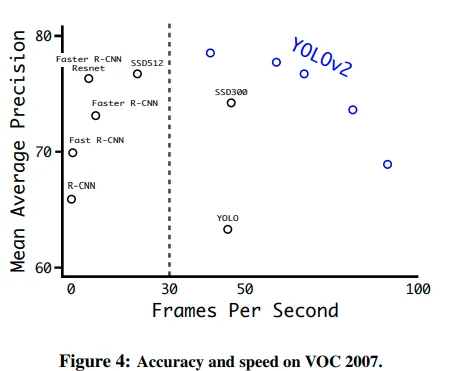

### Mais Rápida

#### Darknet-19

Os autores propõem um novo backbone, Darknet-19, que possui 19 camadas convolucionais e 5 camadas de maxpooling. São necessárias 5,58 bilhões de operações para processar uma imagem; no entanto, atinge 72,9% para precisão top-1 e 91,2% para precisão top-5 no ImageNet.

#### Treinamento para classificação

Os autores utilizam aumentos padrão. Primeiro, eles treinam seu backbone proposto com resolução de entrada de 224 × 224 e o ajustam para um tamanho maior, 448, por 10 épocas. Por favor, consulte o artigo original para mais detalhes.

### Mais Forte

Existem vários conjuntos de dados para classificação e detecção. Eles podem combinar juntos? Observe que os autores propõem o YOLO9000, não o YOLO v2, apenas por esse motivo. Eles combinaram dois conjuntos de dados para obter mais de 9.000 classes, portanto, esta parte é sobre como o YOLO9000 foi treinado.

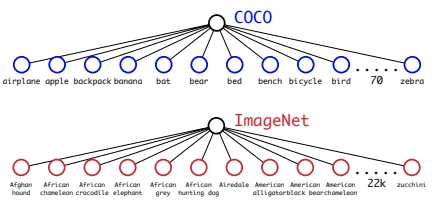

O Microsoft COCO contém 100 mil imagens, possuindo 80 classes, rótulos de detecção e classes são mais gerais, por exemplo “cachorro” ou “barco”.

ImageNet possui 13 milhões de imagens, com 22k classes, rótulos de classificação, classes são mais específicas como “Norfolk terrier”, “Yorkshire terrier” ou “Bedlington terrier”.

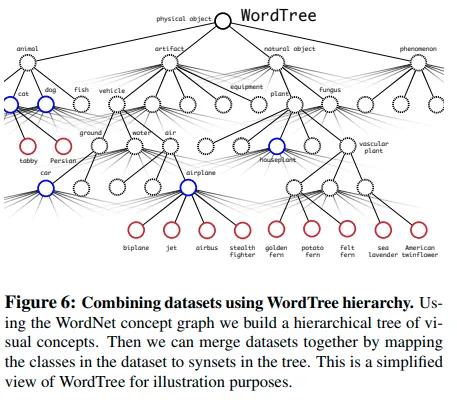

Conforme mostrado acima, os autores constroem uma árvore hierárquica de conceitos visuais usando WordTree. Portanto, “Norfolk terrier” também é rotulado como “cachorro” e “mamífero”. São 9.418 turmas no total.

#### Classificação e detecção conjunta

- Os autores usam 3 anteriores, e não 5, para limitar o tamanho da saída.
- Para imagem de detecção, a perda é retropropagada normalmente.
- Para imagem de classificação, apenas a perda de classificação é retropropagada no nível correspondente do rótulo ou acima dele.

## YOLO v3

O título oficial do artigo YOLO v2 parecia que YOLO era uma bebida saudável à base de leite para crianças, em vez de um algoritmo de detecção de objetos. Foi nomeado “YOLO9000: Melhor, Mais Rápido, Mais Forte”.

Já é hora do YOLO 9000 ser o algoritmo mais rápido e também um dos mais precisos. No entanto, alguns anos depois, ele não é mais o mais preciso, com algoritmos como RetinaNet e SSD superando-o em termos de precisão. Ainda assim, no entanto, foi um dos mais rápidos.

Mas essa velocidade foi trocada por aumentos de precisão no YOLO v3. Enquanto a variante anterior rodava a 45 FPS em um Titan X, a versão atual rodava cerca de 30 FPS. Isso tem a ver com o aumento da complexidade da arquitetura subjacente chamada Darknet.

### Darknet-53

YOLO v2 usou uma arquitetura profunda personalizada darknet-19, uma rede originalmente de 19 camadas complementada com mais 11 camadas para detecção de objetos. Com uma arquitetura de 30 camadas, o YOLO v2 frequentemente enfrentava dificuldades com detecções de pequenos objetos. Isso foi atribuído à perda de recursos refinados à medida que as camadas reduziam a amostragem da entrada. Para remediar isso, o YOLO v2 usou um mapeamento de identidade, concatenando mapas de recursos de uma camada anterior para capturar recursos de baixo nível.

No entanto, a arquitetura do YOLO v2 ainda carecia de alguns dos elementos mais importantes que agora são básicos na maioria dos algoritmos de última geração. Sem blocos residuais, sem conexões de salto e sem upsampling. YOLO v3 incorpora tudo isso.

Primeiro, o YOLO v3 usa uma variante do Darknet, que originalmente possui uma rede de 53 camadas treinada no Imagenet. Para a tarefa de detecção, mais 53 camadas são empilhadas nele, dando-nos uma arquitetura subjacente totalmente convolucional de 106 camadas para YOLO v3. Esta é a razão por trás da lentidão do YOLO v3 em comparação com o YOLO v2. Esta é a aparência da arquitetura do YOLO agora.

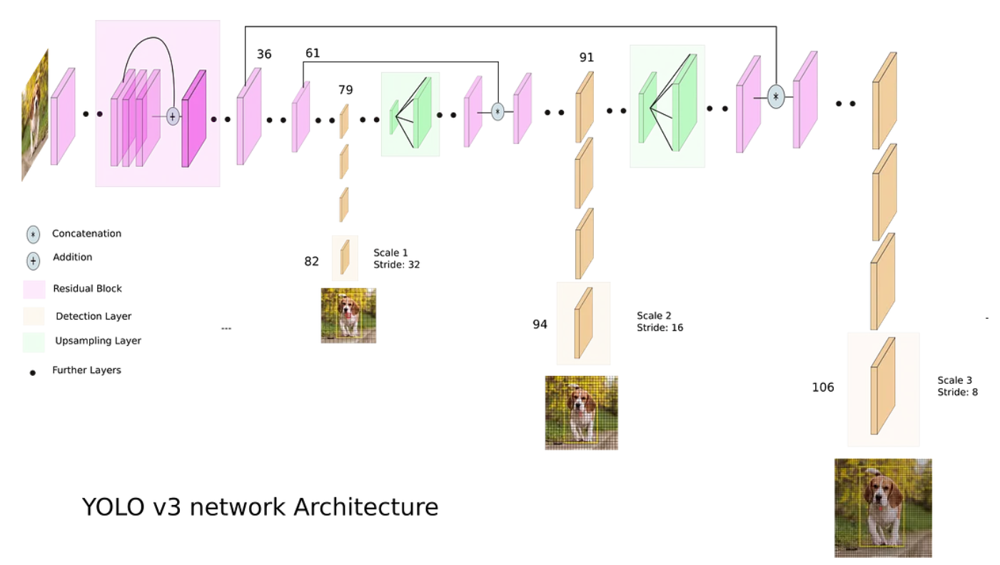

### Detecção em três escalas

A arquitetura mais recente possui conexões de salto residuais e aumento da resolução. A característica mais saliente da v3 é que ela faz detecções em três escalas diferentes. YOLO é uma rede totalmente convolucional e sua saída final é gerada pela aplicação de um kernel 1 x 1 em um mapa de recursos. No YOLO v3, a detecção é feita aplicando kernels de detecção 1 x 1 em mapas de recursos de três tamanhos diferentes em três locais diferentes na rede.

A forma do kernel de detecção é 1 x 1 x (B x (5 + C) ). Aqui B é o número de caixas delimitadoras que uma célula no mapa de recursos pode prever, “5” é para os 4 atributos da caixa delimitadora e a confiança de um objeto, e C é o número de classes. No YOLO v3 treinado em COCO, B = 3 e C = 80, então o tamanho do kernel é 1 x 1 x 255. O mapa de recursos produzido por este kernel tem altura e largura idênticas ao mapa de recursos anterior e possui atributos de detecção ao longo do profundidade conforme descrito acima.

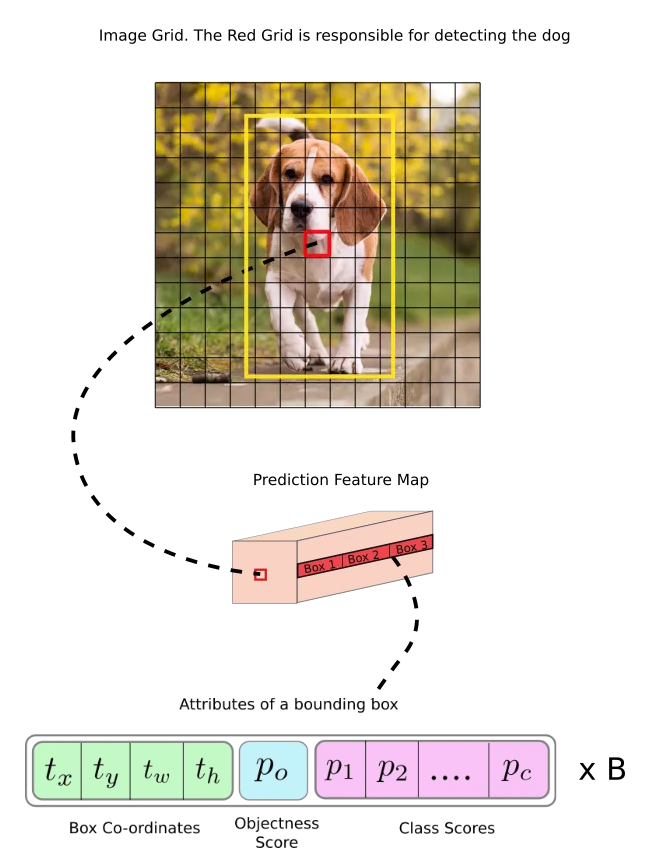

Antes de prosseguirmos, gostaria de salientar que o avanço da rede, ou uma camada, é definido como a proporção pela qual ela reduz a resolução da entrada. Nos exemplos a seguir, assumirei que temos uma imagem de entrada de tamanho 416 x 416.

O YOLO v3 faz previsões em três escalas, que são fornecidas precisamente pela redução da resolução das dimensões da imagem de entrada em 32, 16 e 8, respectivamente.

A primeira detecção é feita pela 82ª camada. Para as primeiras 81 camadas, a imagem é amostrada pela rede, de modo que a 81ª camada tenha um passo de 32. Se tivermos uma imagem de 416 x 416, o mapa de características resultante teria o tamanho de 13 x 13. Uma detecção é feito aqui usando o kernel de detecção 1 x 1, fornecendo um mapa de recursos de detecção de 13 x 13 x 255.

Em seguida, o mapa de características da camada 79 é submetido a algumas camadas convolucionais antes de ser amostrado em 2x para dimensões de 26 x 26. Este mapa de características é então concatenado em profundidade com o mapa de características da camada 61. Em seguida, os mapas de características combinados são novamente submeteu algumas camadas convolucionais 1 x 1 para fundir os recursos da camada anterior (61). Então, a segunda detecção é feita pela 94ª camada, produzindo um mapa de características de detecção de 26 x 26 x 255.

Um procedimento semelhante é seguido novamente, onde o mapa de características da camada 91 é submetido a algumas camadas convolucionais antes de ser concatenado em profundidade com um mapa de características da camada 36. Como antes, algumas camadas convolucionais 1 x 1 seguem para fundir as informações do anterior camada (36). Fazemos o final da 3 na 106ª camada, produzindo um mapa de características de tamanho 52 x 52 x 255.

### Melhor na detecção de objetos menores

As detecções em diferentes camadas ajudam a resolver o problema de detecção de pequenos objetos, uma reclamação frequente do YOLO v2. As camadas ampliadas concatenadas com as camadas anteriores ajudam a preservar os recursos de granulação fina que ajudam na detecção de pequenos objetos.

A camada 13 x 13 é responsável pela detecção de objetos grandes, enquanto a camada 52 x 52 detecta os objetos menores, e a camada 26 x 26 detecta objetos médios. Aqui está uma análise comparativa de diferentes objetos selecionados no mesmo objeto por diferentes camadas.

### Escolha de caixas de ancoragem

YOLO v3, no total usa 9 caixas de âncora. Três para cada escala. Se você estiver treinando YOLO em seu próprio conjunto de dados, você deve usar o clustering K-Means para gerar 9 âncoras.

Em seguida, organize as âncoras em ordem decrescente de uma dimensão. Atribua as três maiores âncoras para a primeira escala, as três seguintes para a segunda escala e as três últimas para a terceira.

### Mais caixas delimitadoras por imagem

Para uma imagem de entrada do mesmo tamanho, o YOLO v3 prevê mais caixas delimitadoras do que o YOLO v2. Por exemplo, com sua resolução nativa de 416 x 416, o YOLO v2 previu 13 x 13 x 5 = 845 caixas. Em cada célula da grade, 5 caixas foram detectadas utilizando 5 âncoras.

Por outro lado, o YOLO v3 prevê caixas em 3 escalas diferentes. Para a mesma imagem de 416 x 416, o número de caixas previstas é 10.647. Isso significa que o YOLO v3 prevê 10x o número de caixas previstas pelo YOLO v2. Você pode facilmente imaginar por que é mais lento que o YOLO v2. Em cada escala, cada grade pode prever 3 caixas usando 3 âncoras. Como existem três balanças, o número de caixas de ancoragem utilizadas no total é 9, 3 para cada balança.

### Benchmarking

O YOLO v3 tem desempenho equivalente a outros detectores de última geração, como o RetinaNet, embora seja consideravelmente mais rápido, no benchmark COCO mAP 50. Também é melhor que SSD e suas variantes. Aqui está uma comparação de desempenho direto do paper.

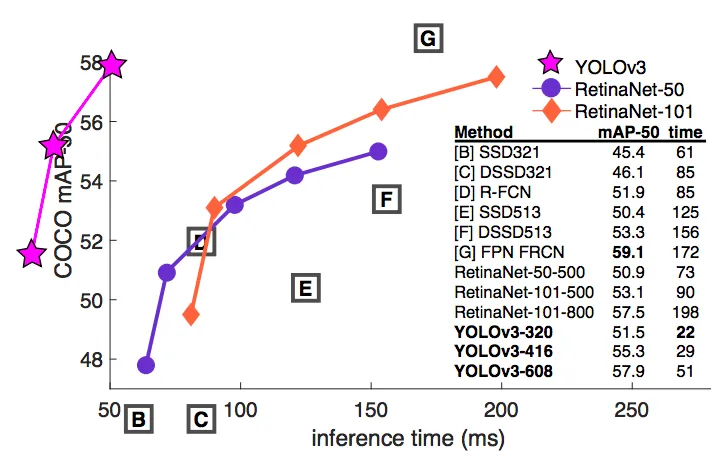

## YOLO v4

YOLOv4 foi um modelo de detecção de objetos em tempo real publicado em abril de 2020 que alcançou desempenho de última geração no conjunto de dados COCO. Ele funciona dividindo a tarefa de detecção de objetos em duas partes, regressão para identificar o posicionamento do objeto por meio de caixas delimitadoras e classificação para determinar a classe do objeto. Esta implementação do YoloV4 usa a estrutura Darknet.

Ao usar o YOLOv4, você está implementando muitas das contribuições de pesquisa anteriores na família YOLO, juntamente com uma série de novas contribuições exclusivas do YOLOv4, incluindo novos recursos: WRC, CSP, CmBN, SAT, ativação Mish, aumento de dados Mosaic, CmBN, regularização DropBlock e perda de CIoU. Resumindo, com o YOLOv4, você está usando uma arquitetura de rede de detecção de objetos melhor e novas técnicas de aumento de dados.

### YOLOv4 Architecture

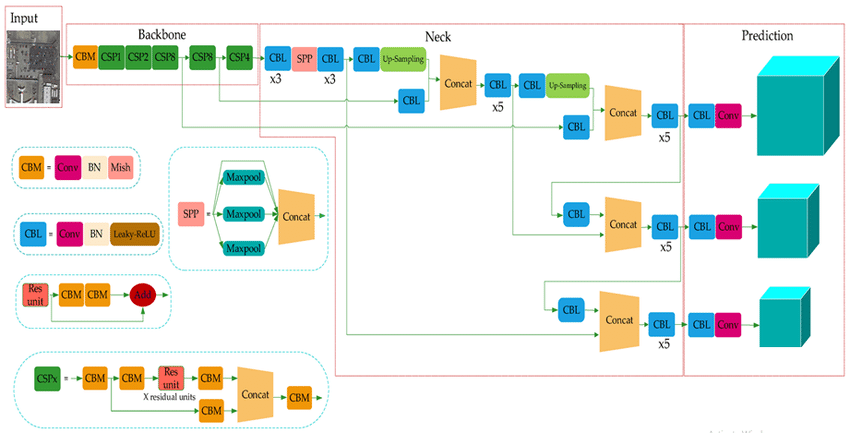

### Resultados da YOLO v4:

Como pode ser visto nos resultados abaixo, YOLOv4 tem um desempenho incrivelmente alto para um FPS muito alto; esta foi uma grande melhoria em relação aos modelos anteriores de detecção de objetos, que tinham apenas alto desempenho ou altas velocidades de inferência.

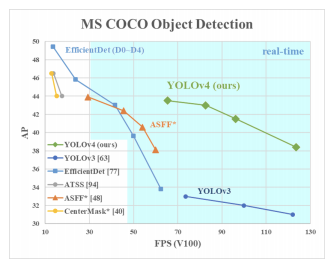

## YOLO v5

### Origem do YOLOv5: uma extensão do YOLOv3 PyTorch

O repositório YOLOv5 é uma extensão natural do repositório YOLOv3 PyTorch de Glenn Jocher. O repositório YOLOv3 PyTorch era um destino popular para os desenvolvedores portarem pesos YOLOv3 Darknet para PyTorch e depois avançarem para a produção. Muitos (incluindo nossa equipe de visão no Roboflow) gostaram da facilidade de uso do branch PyTorch e usariam esta saída para implantação.

Depois de replicar totalmente a arquitetura do modelo e o procedimento de treinamento do YOLOv3, a Ultralytics começou a fazer melhorias na pesquisa juntamente com alterações no design do repositório com o objetivo de capacitar milhares de desenvolvedores a treinar e implantar seus próprios detectores de objetos personalizados para detectar qualquer objeto no mundo. Este é um objetivo que compartilhamos aqui no Roboflow.

Esses avanços foram originalmente denominados YOLOv4 devido ao recente lançamento do YOLOv4 na estrutura Darknet, o modelo foi renomeado para YOLOv5 para evitar colisões de versões.

### Uma Visão Geral da Arquitetura YOLOv5

O modelo YOLO foi o primeiro detector de objetos a conectar o procedimento de previsão de caixas delimitadoras com rótulos de classe em uma rede diferenciável de ponta a ponta.

A rede YOLO consiste em três peças principais.

- Backbone: Uma rede neural convolucional que agrega e forma recursos de imagem em diferentes granularidades.
- Neck: Uma série de camadas para misturar e combinar recursos de imagem para passá-los para previsão.
- Head: consome recursos do Neck e executa etapas de previsão de caixa e classe.

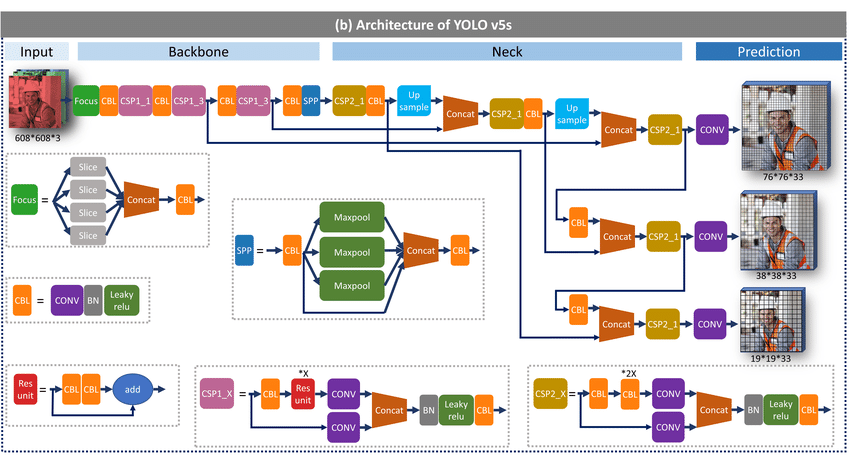

Dito isso, há muitas abordagens que podem ser adotadas para combinar diferentes arquiteturas em cada componente principal. As contribuições do YOLOv4 e YOLOv5 são principalmente para integrar avanços em outras áreas da visão computacional e provar que, como uma coleção, eles melhoram a detecção de objetos YOLO.

### Aprendizado Automático dos Bounding Box Anchors

No repositório YOLOv3 PyTorch, Glenn Jocher introduziu a ideia de aprender caixas de âncora com base na distribuição de caixas delimitadoras no conjunto de dados personalizado com K-Means e algoritmos de aprendizagem genética. Isso é muito importante para tarefas personalizadas, porque a distribuição dos tamanhos e locais das caixas delimitadoras pode ser drasticamente diferente das âncoras predefinidas da caixa delimitadora no conjunto de dados COCO.

Para fazer previsões de caixas, a rede YOLOv5 prevê caixas delimitadoras como desvios de uma lista de dimensões de caixas âncora.

A diferença mais extrema nas caixas de âncora pode ocorrer se estivermos tentando detectar algo como girafas, que são muito altas e magras, ou raias manta, que são muito largas e planas. Todas as caixas de âncora YOLO são aprendidas automaticamente no YOLOv5 quando você insere seus dados personalizados.

### CSP Backbone

Tanto o YOLOv4 quanto o YOLOv5 implementam o Gargalo CSP para formular recursos de imagem. O crédito de pesquisa para esta arquitetura é direcionado a WongKinYiu e seu artigo recente sobre Cross Stage Partial Networks para backbone de rede neural convolucional.

O CSP aborda problemas de gradiente duplicado em outros backbones ConvNet maiores, resultando em menos parâmetros e menos FLOPS de importância comparável. Isto é extremamente importante para a família YOLO, onde a velocidade de inferência e o tamanho pequeno do modelo são de extrema importância.

Os modelos CSP são baseados em DenseNet. DenseNet foi projetado para conectar camadas em redes neurais convolucionais com as seguintes motivações:

- para aliviar o problema do gradiente de fuga (é difícil fazer backprop de sinais de perda através de uma rede muito profunda);
- para reforçar a propagação de recursos;
- incentivar a rede a reutilizar recursos e;
- para reduzir o número de parâmetros de rede.

Em CSPResNext50 e CSPDarknet53, o DenseNet foi editado para separar o mapa de características da camada base, copiando-o e enviando uma cópia através do bloco denso e enviando outra diretamente para o próximo estágio. A ideia com CSPResNext50 e CSPDarknet53 é remover gargalos computacionais no DenseNet e melhorar o aprendizado transmitindo uma versão não editada do mapa de recursos.

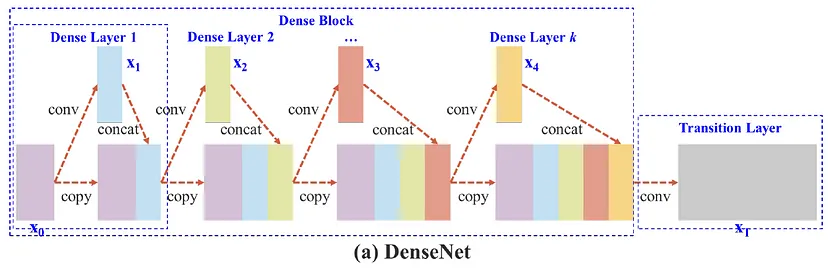

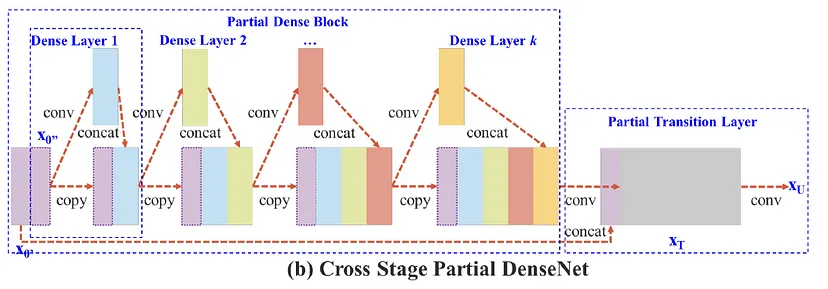

### PA-Net Neck

Tanto o YOLOv4 quanto o YOLOv5 implementam o PA-NET Neck para agregação de recursos.

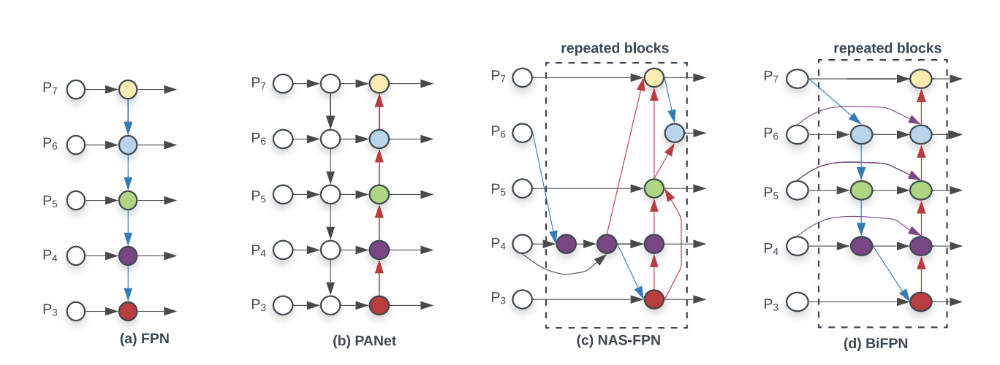

Cada um dos P_i acima representa uma camada de recursos no backbone do CSP.

A imagem acima vem de uma pesquisa feita pelo Google Brain sobre a arquitetura de detecção de objetos EfficientDet. Os autores do EfficientDet descobriram que o BiFPN é a melhor escolha para o pescoço de detecção, e pode ser uma área de maior estabilidade para YOLOv4 e YOLOv5 explorarem com outras implementações aqui.

Certamente vale a pena notar aqui que o YOLOv5 toma emprestado o inquérito de pesquisa do YOLOv4 para decidir sobre o melhor braço para sua arquitetura. YOLOv4 investigou várias possibilidades para o melhor Neck YOLO, incluindo:

- FPN
- PAN
- NAS-FPN
- BiFPN
- ASFF
- SFAM

### Métricas de avaliação preliminar do YOLOv5

As métricas de avaliação apresentadas nesta seção são preliminares e podemos esperar que um artigo de pesquisa formal seja publicado no YOLOv5 quando o trabalho de pesquisa estiver concluído e mais contribuições novas tiverem sido feitas à família de modelos YOLO.

Dito isso, é útil fornecer essas métricas para um desenvolvedor que está considerando qual estrutura usar hoje, antes que os artigos de pesquisa YOLOv5 sejam publicados.

As métricas de avaliação abaixo são baseadas no desempenho do conjunto de dados COCO, que contém uma ampla variedade de imagens contendo 80 classes de objetos. Para mais detalhes sobre a métrica de desempenho, veja este post sobre o que é mAP.

O artigo oficial YOLOv4 publica as seguintes métricas de avaliação executando sua rede treinada no conjunto de dados COCO em uma GPU V100:

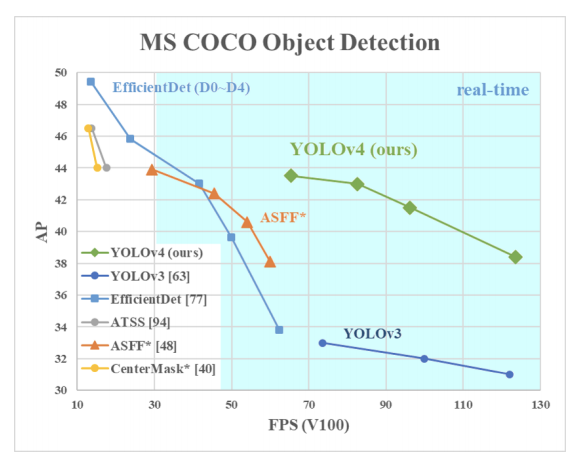

## Caso de Uso; Detecção de Laranjeiras com a YOLO v5

### Preparação do conjunto de dados

Para colocar seu detector de objetos em funcionamento, você deve primeiro coletar fotografias de treinamento. Você deve pensar cuidadosamente sobre a atividade que está tentando concluir e planejar com antecedência os componentes da tarefa que seu modelo pode achar difícil. Para melhorar a precisão de seu modelo final, recomendo reduzir o domínio que seu modelo deve manipular tanto quanto possível.

Para treinamento personalizado YOLOv5, precisamos desenvolver um conjunto de dados. Se você não tiver nenhum dado, poderá usar o banco de dados openimages .

### Anotando o conjunto de dados

Use LabelImg ou qualquer ferramenta de anotação para anotar o conjunto de dados. Crie um arquivo com o mesmo nome da imagem e do texto da anotação.

Prepare um conjunto, por exemplo, correspondente a

- imagens_0.jpg
- imagens_0.txt

YOLOv7 aceita dados de etiquetas em arquivos de texto (.txt) no seguinte formato:

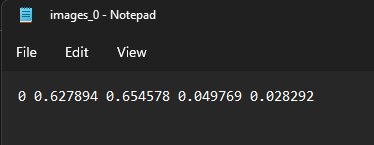

### Implementando:

Neste exemplo, vamos usar uma parte da área total de uma imagem de Drone para criar o dataset. Nesta parte vamos usar o Qgis e criar um .SHP de polígonos onde vamos desenhar cada objeto da imagem conforme o exemplo abaixo. É possível desenhar poligonos mais simples pois aqui estamos interessados somente no boundbox das árvores e não segmentar cada arvore perfeitamente. Apos coletar todos os indivíduos da imagem vamos trabalhar o código a fim de obter o formato mencionado acima para alimentar a YOLOv5

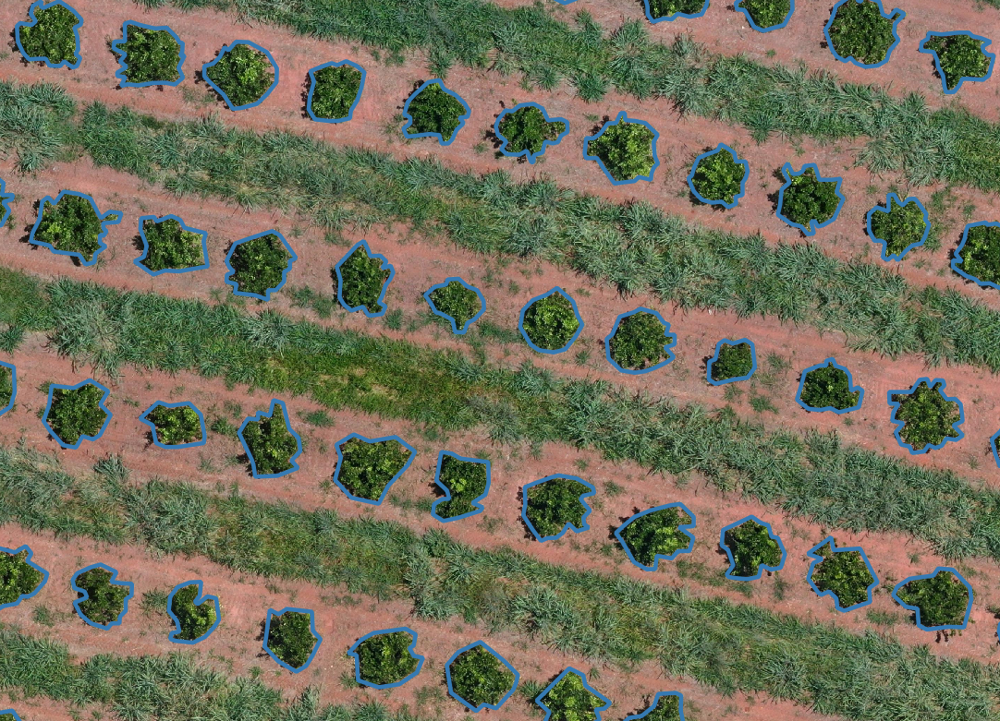

Vamos usar uma implementação pronta do YOLO v5 para detectar laranjeiras em uma imagem de UAV.

Primeiramente, instalaremos o rasterio e geopandas para manipulação da imagem do UAV e shapefile com a delimitação das amostras de treinamento:

In [ ]:
!pip install rasterio
!pip install geopandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 74.1 MB/s eta 0:00:00


Importaremos os pacotes e funções que usaremos aqui:

In [ ]:
import rasterio
import geopandas as gpd
import numpy as np
from matplotlib import pyplot as plt
import cv2
from rasterio.features import rasterize
from rasterio.windows import Window
import os
from shapely.geometry import box
import pandas as pd
from skimage.io import imsave
from sklearn import model_selection
import os
import shutil
import json
import ast
import numpy as np
from tqdm import tqdm
import pandas as  pd
import seaborn as sns
import fastai.vision as vision
import glob

Os próximos passos são: montar o Drive, definir os caminhos dos arquivos e importá-los:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path_img = '/content/drive/MyDrive/Datasets/orange_trees/Orange_trees.tif'
path_shp = '/content/drive/MyDrive/Datasets/orange_trees/orange_trees.shp'

In [ ]:
label = gpd.read_file(path_shp)

In [ ]:
src = rasterio.open(path_img)

In [ ]:
img = src.read()

In [ ]:
img.shape

(3, 5106, 15360)

In [ ]:
img = img.transpose([1,2,0])

Agora podemos plotar a imagem original:

(-0.5, 15359.5, 5105.5, -0.5)

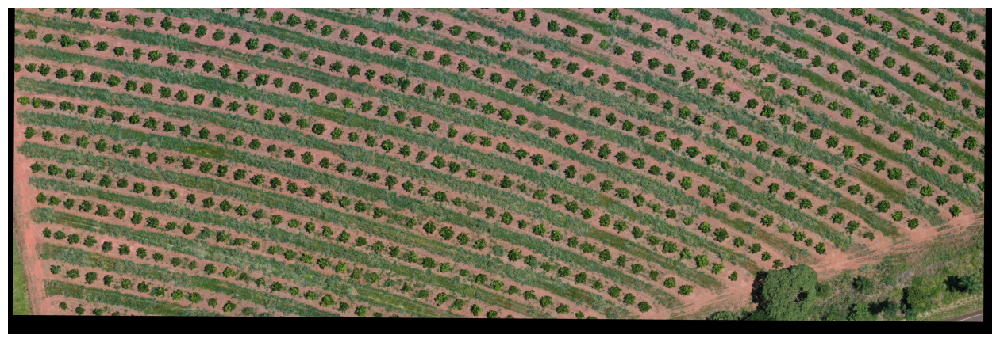

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)
plt.axis('off')

Então, vamos dividir essa imagem em vários patches de 1024x1024 pixels:

In [ ]:
qtd = 0
out_meta = src.meta.copy()
for n in range((src.meta['width']//1024)):
  for m in range((src.meta['height']//1024)):
    x = (512+(n*1024))
    y = (512+(m*1024))
    window = Window(x,y,1024,1024)
    win_transform = src.window_transform(window)
    arr_win = src.read(window=window)
    arr_win = arr_win[0:3,:,:]
    qtd = qtd + 1
    path_exp = '/content/drive/MyDrive/Datasets/orange_trees/data/img_' + str(qtd) + '.tif'
    out_meta.update({"driver": "GTiff","height": 1024,"width": 1024, "transform":win_transform})
    with rasterio.open(path_exp, 'w', **out_meta) as dst:
        for i, layer in enumerate(arr_win, start=1):
            dst.write_band(i, layer.reshape(-1, layer.shape[-1]))
    del arr_win

Temos então a pasta Data com os patches resultantes da divisão. Vamos separar essas imagens em imagens de treinamento e imagens para validação:

In [ ]:
path_data = '/content/drive/MyDrive/Datasets/orange_trees/data/'

In [ ]:
images_files = [f for f in os.listdir(path_data)]

In [ ]:
images_files_train, images_files_valid= model_selection.train_test_split(
    images_files,
    test_size=0.1,
    random_state=42,
    shuffle=True,
)
print(len(images_files_train))
print(len(images_files_valid))

54
6


Os patches estão no formato .tiff, mas a implementação do YOLOv5 requer imagens no formato .jpg. Vamos então criar duas pastas em nosso conteúdo do Google Colab para armazenar as imagens de treinamento e validação.

In [ ]:
destination_1 = 'train'
destination_2 = 'validation'

if not os.path.isdir(destination_1):
    os.mkdir(destination_1)
if not os.path.isdir(destination_2):
    os.mkdir(destination_2)

In [ ]:
path_data_new = '/content/train'
for images in images_files_train:
  src = rasterio.open(os.path.join(path_data,images))
  raster = src.read()
  raster = raster.transpose([1,2,0])
  imsave(os.path.join(path_data_new,images.split('.')[0] + '.jpg'), raster)

In [ ]:
path_data_new = '/content/validation'
for images in images_files_valid:
  src = rasterio.open(os.path.join(path_data,images))
  raster = src.read()
  raster = raster.transpose([1,2,0])
  imsave(os.path.join(path_data_new,images.split('.')[0] + '.jpg'), raster)

Agora vamos trabalhar com Labels. Primeiro verificamos se a imagem e o vetor possuem o mesmo sistema de coordenadas:

In [ ]:
src.crs

CRS.from_epsg(31982)

In [ ]:
label = label.to_crs(31982)

In [ ]:
label.crs

<Projected CRS: EPSG:31982>
Name: SIRGAS 2000 / UTM zone 22S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 54°W and 48°W, northern and southern hemispheres, onshore and offshore. In remainder of South America - between 54°W and 48°W, southern hemisphere, onshore and offshore.
- bounds: (-54.0, -54.18, -47.99, 7.04)
Coordinate Operation:
- name: UTM zone 22S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Vamos plotar os rótulos:

<Axes: >

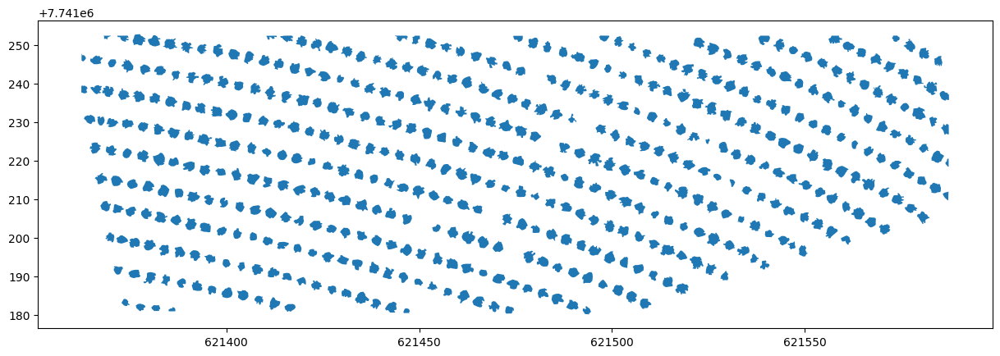

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
label.plot(ax = ax)

No entanto, usaremos apenas as caixas delimitadoras de cada laranjeira.

In [ ]:
Bound_list = []
for i,p in label.iterrows():
  bound = label['geometry'][i].bounds
  bound_rect = (bound[0],bound[1],bound[2],bound[3])
  geom = box(*bound_rect)
  Bound_list.append(geom)
gdf_bounds = gpd.GeoDataFrame(geometry=Bound_list)

<Axes: >

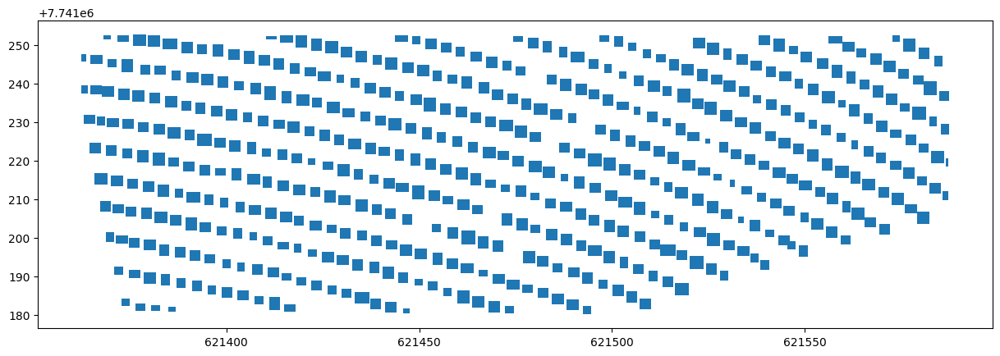

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
gdf_bounds.plot(ax = ax)

Agora vamos criar os conjuntos de dados de treinamento e validação com os bboxes que cruzam cada um dos patches:

In [ ]:
poly_geometry_train = []
img_id_train = []
for fp1 in images_files_train:
  src1 = rasterio.open(os.path.join(path_data,fp1))
  bounds1  = src1.bounds
  df1 = gpd.GeoDataFrame({"id":1,"geometry":[box(*bounds1)]})
  df1 = df1.set_crs(epsg=31982)

  for i,row in gdf_bounds.iterrows():
    intersects = df1['geometry'][0].intersection(row['geometry'])
    if (intersects.is_empty == False):
      poly_geometry_train.append(intersects)
      img_id_train.append(fp1)

/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.int

In [ ]:
poly_geometry_val = []
img_id_val = []
for fp2 in images_files_valid:
  src2 = rasterio.open(os.path.join(path_data,fp2))
  bounds2  = src2.bounds
  df2 = gpd.GeoDataFrame({"id":1,"geometry":[box(*bounds2)]})
  df2 = df2.set_crs(epsg=31982)

  for i,row in gdf_bounds.iterrows():
    intersects = df2['geometry'][0].intersection(row['geometry'])
    if (intersects.is_empty == False):
      poly_geometry_val.append(intersects)
      img_id_val.append(fp2)

/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.int

In [ ]:
dataset_train = gpd.GeoDataFrame(geometry=poly_geometry_train)
dataset_val = gpd.GeoDataFrame(geometry=poly_geometry_val)

In [ ]:
dataset_train['ImageId'] = img_id_train
dataset_val['ImageId'] = img_id_val

Então temos o dataframe com a geometria do bbox e o id da imagem a qual ele pertence:

In [ ]:
dataset_val

,geometry,ImageId
0,"POLYGON ((621368.878 7741229.644, 621368.878 7...",img_1.tif
1,"POLYGON ((621372.923 7741229.644, 621372.923 7...",img_1.tif
2,"POLYGON ((621377.033 7741229.644, 621377.033 7...",img_1.tif
3,"POLYGON ((621368.472 7741239.415, 621370.851 7...",img_1.tif
4,"POLYGON ((621371.908 7741235.714, 621371.908 7...",img_1.tif
5,"POLYGON ((621375.582 7741235.227, 621375.582 7...",img_1.tif
6,"POLYGON ((621380.025 7741234.772, 621380.025 7...",img_1.tif
7,"POLYGON ((621371.470 7741244.855, 621371.470 7...",img_1.tif
8,"POLYGON ((621375.872 7741244.855, 621375.872 7...",img_1.tif
9,"POLYGON ((621380.335 7741244.855, 621380.335 7...",img_1.tif


O próximo passo é converter as coordenadas em valores x e y.

In [ ]:
df_train = []
Id_train = []
for i,row in dataset_train.iterrows():
  ImageID = row['ImageId'].split('.')[0] + '.jpg'
  src1 = rasterio.open(os.path.join(path_data,row['ImageId']))
  poly = []
  for point in list(row.geometry.exterior.coords):
    x = point[0]
    y = point[1]
    row, col = src1.index(x,y)
    tuple = (row,col)
    poly.append(tuple)
  Id_train.append(ImageID)
  df_train.append(poly)

In [ ]:
df_val = []
Id_val = []
for i,row in dataset_val.iterrows():
  ImageID = row['ImageId'].split('.')[0] + '.jpg'
  src2 = rasterio.open(os.path.join(path_data,row['ImageId']))
  poly = []
  for point in list(row.geometry.exterior.coords):
    x = point[0]
    y = point[1]
    row, col = src2.index(x,y)
    tuple = (row,col)
    poly.append(tuple)
  Id_val.append(ImageID)
  df_val.append(poly)

In [ ]:
train_set = pd.DataFrame([])
valid_set = pd.DataFrame([])

In [ ]:
train_set['ImageId'] = Id_train
valid_set['ImageId'] = Id_val

In [ ]:
train_set['geometry'] = df_train
valid_set['geometry'] = df_val

Como só temos a classe laranjeiras, vamos configurá-la.

In [ ]:
train_set['class'] = 0
train_set['class_name'] = 'orange_tree'

valid_set['class'] = 0
valid_set['class_name'] = 'orange_tree'

In [ ]:
train_set

,ImageId,geometry,class,class_name
0,img_32.jpg,"[(677, 0), (677, 70), (850, 70), (850, 0), (67...",0,orange_tree
1,img_32.jpg,"[(905, 114), (764, 114), (764, 300), (905, 300...",0,orange_tree
2,img_32.jpg,"[(1002, 389), (831, 389), (831, 579), (1002, 5...",0,orange_tree
3,img_32.jpg,"[(1024, 629), (924, 629), (924, 844), (1024, 8...",0,orange_tree
4,img_32.jpg,"[(391, 138), (174, 138), (174, 346), (391, 346...",0,orange_tree
...,...,...,...,...
489,img_38.jpg,"[(483, 101), (307, 101), (307, 300), (483, 300...",0,orange_tree
490,img_38.jpg,"[(211, 0), (211, 52), (402, 52), (402, 0), (21...",0,orange_tree
491,img_38.jpg,"[(304, 1024), (304, 950), (151, 950), (151, 10...",0,orange_tree
492,img_38.jpg,"[(0, 926), (204, 926), (204, 753), (0, 753), (...",0,orange_tree


Precisamos apenas obter as coordenadas xmax, ymax, xmin e ymim para cada anotação. Para isso usaremos a função getBounds:

In [ ]:
def getBounds(geometry):
    try:
        arr = np.array(geometry).T
        xmin = np.min(arr[0])
        ymin = np.min(arr[1])
        xmax = np.max(arr[0])
        ymax = np.max(arr[1])
        return (xmin, ymin, xmax, ymax)
    except:
        return np.nan

def getWidth(bounds):
    try:
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(xmax - xmin)
    except:
        return np.nan

def getHeight(bounds):
    try:
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(ymax - ymin)
    except:
        return np.nan

In [ ]:
train_set.loc[:,'bounds'] = train_set.loc[:,'geometry'].apply(getBounds)
train_set.loc[:,'width'] = train_set.loc[:,'bounds'].apply(getWidth)
train_set.loc[:,'height'] = train_set.loc[:,'bounds'].apply(getHeight)
train_set.head(10)

,ImageId,geometry,class,class_name,bounds,width,height
0,img_32.jpg,"[(677, 0), (677, 70), (850, 70), (850, 0), (67...",0,orange_tree,"(677, 0, 850, 70)",173,70
1,img_32.jpg,"[(905, 114), (764, 114), (764, 300), (905, 300...",0,orange_tree,"(764, 114, 905, 300)",141,186
2,img_32.jpg,"[(1002, 389), (831, 389), (831, 579), (1002, 5...",0,orange_tree,"(831, 389, 1002, 579)",171,190
3,img_32.jpg,"[(1024, 629), (924, 629), (924, 844), (1024, 8...",0,orange_tree,"(924, 629, 1024, 844)",100,215
4,img_32.jpg,"[(391, 138), (174, 138), (174, 346), (391, 346...",0,orange_tree,"(174, 138, 391, 346)",217,208
5,img_32.jpg,"[(453, 374), (271, 374), (271, 580), (453, 580...",0,orange_tree,"(271, 374, 453, 580)",182,206
6,img_32.jpg,"[(553, 649), (392, 649), (392, 819), (553, 819...",0,orange_tree,"(392, 649, 553, 819)",161,170
7,img_32.jpg,"[(642, 1024), (642, 918), (469, 918), (469, 10...",0,orange_tree,"(469, 918, 642, 1024)",173,106
8,img_32.jpg,"[(0, 736), (0, 736), (0, 538), (0, 538), (0, 7...",0,orange_tree,"(0, 538, 0, 736)",0,198
9,img_32.jpg,"[(0, 986), (76, 986), (76, 792), (0, 792), (0,...",0,orange_tree,"(0, 792, 76, 986)",76,194


In [ ]:
valid_set.loc[:,'bounds'] = valid_set.loc[:,'geometry'].apply(getBounds)
valid_set.loc[:,'width'] = valid_set.loc[:,'bounds'].apply(getWidth)
valid_set.loc[:,'height'] = valid_set.loc[:,'bounds'].apply(getHeight)
valid_set.head(10)

,ImageId,geometry,class,class_name,bounds,width,height
0,img_1.jpg,"[(1024, 27), (927, 27), (927, 242), (1024, 242...",0,orange_tree,"(927, 27, 1024, 242)",97,215
1,img_1.jpg,"[(1024, 299), (947, 299), (947, 504), (1024, 5...",0,orange_tree,"(947, 299, 1024, 504)",77,205
2,img_1.jpg,"[(1024, 576), (1000, 576), (1000, 761), (1024,...",0,orange_tree,"(1000, 576, 1024, 761)",24,185
3,img_1.jpg,"[(366, 0), (366, 160), (559, 160), (559, 0), (...",0,orange_tree,"(366, 0, 559, 160)",193,160
4,img_1.jpg,"[(615, 231), (410, 231), (410, 438), (615, 438...",0,orange_tree,"(410, 231, 615, 438)",205,207
5,img_1.jpg,"[(648, 478), (448, 478), (448, 695), (648, 695...",0,orange_tree,"(448, 478, 648, 695)",200,217
6,img_1.jpg,"[(678, 777), (488, 777), (488, 964), (678, 964...",0,orange_tree,"(488, 777, 678, 964)",190,187
7,img_1.jpg,"[(0, 201), (41, 201), (41, 53), (0, 53), (0, 2...",0,orange_tree,"(0, 53, 41, 201)",41,148
8,img_1.jpg,"[(0, 498), (134, 498), (134, 292), (0, 292), (...",0,orange_tree,"(0, 292, 134, 498)",134,206
9,img_1.jpg,"[(0, 798), (168, 798), (168, 616), (0, 616), (...",0,orange_tree,"(0, 616, 168, 798)",168,182


Depois disso criamos os arquivos .csv para usar no YOLOv5:

In [ ]:
def convert(data, data_type):
    df = data.groupby('ImageId')['bounds'].apply(list).reset_index(name='bboxes')
    df['classes'] = data.groupby('ImageId')['class'].apply(list).reset_index(drop=True)
    df.to_csv(data_type + '.csv', index=False)
    print(data_type)
    print(df.shape)
    print(df.head())

df_train = convert(train_set, '/content/train')
df_valid = convert(valid_set, '/content/validation')

/content/train
(52, 3)
      ImageId                                             bboxes  \
0  img_10.jpg  [(782, 0, 910, 62), (776, 160, 994, 335), (874...   
1  img_11.jpg  [(781, 0, 935, 79), (804, 193, 992, 344), (873...   
2  img_13.jpg  [(955, 0, 1024, 72), (981, 121, 1024, 330), (4...   
3  img_14.jpg  [(991, 0, 1023, 148), (456, 0, 640, 114), (515...   
4  img_15.jpg  [(517, 0, 704, 193), (587, 222, 763, 404), (67...   

                                classes  
0  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  
1  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  
2     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  
3     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  
4           [0, 0, 0, 0, 0, 0, 0, 0, 0]  
/content/validation
(6, 3)
      ImageId                                             bboxes  \
0   img_1.jpg  [(927, 27, 1024, 242), (947, 299, 1024, 504), ...   
1  img_12.jpg  [(813, 0, 1000, 179), (865, 267, 1024, 459), (...   
2  img_37.jpg  [(1021, 753, 1024, 926), (927, 528, 1024, 663)...   
3  img_45.jpg  [(

Agora é a hora de preparar o ambiente para usar o YOLOv5. Copiaremos o github e instalaremos esta versão do pytorch:

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies
#!pip install torch==1.6.0+cu101 torchvision==0.7.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html


Cloning into 'yolov5'...
remote: Enumerating objects: 15994, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 15994 (delta 18), reused 18 (delta 12), pack-reused 15967
Receiving objects: 100% (15994/15994), 14.64 MiB | 28.03 MiB/s, done.
Resolving deltas: 100% (10980/10980), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.0/190.0 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 618.0/618.0 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.9 MB/s eta 0:00:00


In [ ]:
import torch
from IPython.display import Image  # for displaying images

print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', major=7, minor=0, total_memory=16150MB, multi_processor_count=80)


In [ ]:
%cd yolov5
!ls

/content/yolov5
benchmarks.py	 data	     LICENSE	      requirements.txt	tutorial.ipynb
CITATION.cff	 detect.py   models	      segment		utils
classify	 export.py   README.md	      setup.cfg		val.py
CONTRIBUTING.md  hubconf.py  README.zh-CN.md  train.py


Dentro da pasta da yolo, criamos a pasta plant_data para armazenar nossos dados.

In [ ]:
!mkdir plant_data
%cd plant_data

/content/yolov5/plant_data


In [ ]:
!mkdir images
!mkdir labels
%cd images
!mkdir train
!mkdir validation
%cd ..
%cd labels
!mkdir train
!mkdir validation
%cd ..
%cd ..
%cd ..

/content/yolov5/plant_data/images
/content/yolov5/plant_data
/content/yolov5/plant_data/labels
/content/yolov5/plant_data
/content/yolov5
/content


In [ ]:
for root,dir,_ in os.walk('yolov5/plant_data'):
    print(root)
    print(dir)

yolov5/plant_data
['labels', 'images']
yolov5/plant_data/labels
['train', 'validation']
yolov5/plant_data/labels/train
[]
yolov5/plant_data/labels/validation
[]
yolov5/plant_data/images
['train', 'validation']
yolov5/plant_data/images/train
[]
yolov5/plant_data/images/validation
[]


Vamos copiar as imagens e criar um .txt para cada imagem com limites dentro da pasta do nosso projeto que acabamos de criar:

In [ ]:
INPUT_PATH = '/content/'
OUTPUT_PATH = '/content/yolov5/plant_data'
def process_data(data, data_type='train'):
    for _, row in tqdm(data.iterrows(), total = len(data)):
        image_name = row['ImageId'].split('.')[0]
        bounding_boxes = row['bboxes']
        classes = row['classes']
        yolo_data = []
        for bbox, Class in zip(bounding_boxes, classes):

            x_min = bbox[1]
            y_min = bbox[0]
            x_max = bbox[3]
            y_max = bbox[2]

            x_center = (x_min + x_max) / 2.0 / 1024
            y_center = (y_min + y_max) / 2.0 / 1024
            x_extend = (x_max - x_min) / 1024
            y_extend = (y_max - y_min) / 1024

            yolo_data.append([Class, x_center, y_center, x_extend, y_extend])
            ''''x = bbox[0]
            y = bbox[1]
            w = bbox[2]
            h = bbox[3]
            x_center = x + w / 2
            y_center = y + h / 2

            x_center /= 1024
            y_center /= 1024
            w /= 1024
            h /= 1024
            yolo_data.append([Class, x_center, y_center, w, h])'''
        yoy_data = np.array(yolo_data)
        np.savetxt(
            os.path.join(OUTPUT_PATH, f"labels/{data_type}/{image_name}.txt"),
            yolo_data,
            fmt = ["%d", "%f", "%f", "%f", "%f"]
        )
        shutil.copyfile(
            os.path.join(INPUT_PATH, f"{data_type}/{image_name}.jpg"),
            os.path.join(OUTPUT_PATH, f"images/{data_type}/{image_name}.jpg")
        )

df_train = pd.read_csv('/content/train.csv')
df_train.bboxes = df_train.bboxes.apply(ast.literal_eval)
df_train.classes = df_train.classes.apply(ast.literal_eval)

df_valid = pd.read_csv('/content/validation.csv')
df_valid.bboxes = df_valid.bboxes.apply(ast.literal_eval)
df_valid.classes = df_valid.classes.apply(ast.literal_eval)

process_data(df_train, data_type='train')
process_data(df_valid, data_type='validation')

100%|██████████| 6/6 [00:00<00:00, 1161.59it/s]


Aqui podemos verificar se o .txt foi criado corretamente:

In [ ]:
f = open('/content/yolov5/plant_data/labels/train/'+os.listdir("/content/yolov5/plant_data/labels/train/")[0])
print(f.name)
for l in f:
    print(l)

/content/yolov5/plant_data/labels/train/img_58.txt
0 0.005371 0.951172 0.010742 0.095703

0 0.358887 0.668945 0.053711 0.140625

0 0.200684 0.568848 0.215820 0.213867

0 0.022949 0.423828 0.045898 0.150391

0 0.322754 0.097168 0.131836 0.180664

0 0.122070 0.027344 0.130859 0.054688



Por fim, criaremos o yaml com as informações de nossos projetos e executaremos o arquivo train.py. Se necessário, você deve executar este comando duas vezes para iniciar o treinamento:

In [ ]:
%cd yolov5

/content/yolov5


In [ ]:
%%writefile orange_tree.yaml

train: plant_data/images/train
val: plant_data/images/validation
nc: 1
names: ['Orange Tree']

Writing orange_tree.yaml


In [ ]:
!python train.py --img 1024 --batch 8 --epochs 200 --data orange_tree.yaml --cfg models/yolov5l.yaml --name orangetree

train: weights=yolov5s.pt, cfg=models/yolov5l.yaml, data=orange_tree.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=8, imgsz=1024, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=orangetree, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-218-g9e97ac3 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_ga

Depois de terminar o treinamento, podemos observar as estatísticas:

In [ ]:
print(os.listdir('/content/yolov5/runs/train/orangetree'))

['results.csv', 'results.png', 'labels.jpg', 'hyp.yaml', 'train_batch0.jpg', 'val_batch0_labels.jpg', 'labels_correlogram.jpg', 'confusion_matrix.png', 'PR_curve.png', 'weights', 'F1_curve.png', 'events.out.tfevents.1694872662.c29cdf705d45.1808.0', 'train_batch1.jpg', 'val_batch0_pred.jpg', 'opt.yaml', 'P_curve.png', 'train_batch2.jpg', 'R_curve.png']


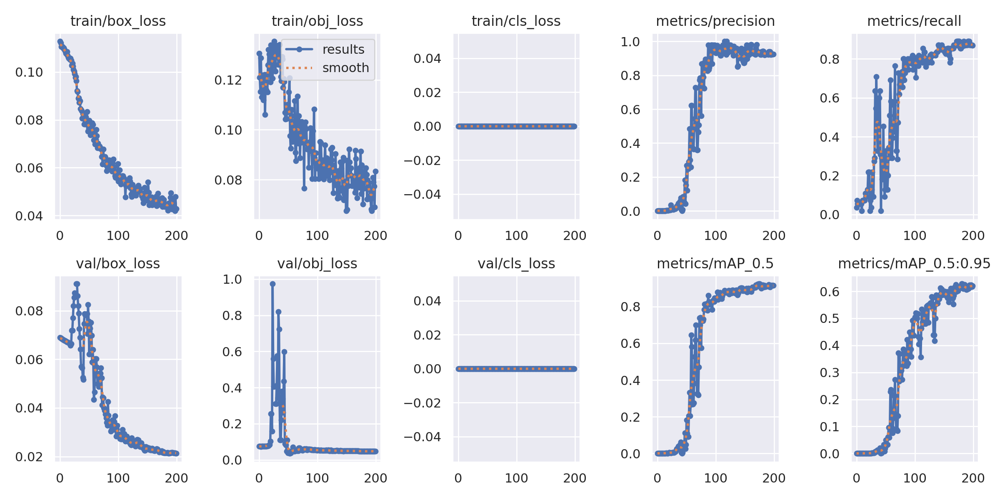

In [ ]:
Image(filename='/content/yolov5/runs/train/orangetree/results.png', width=900)

Também podemos ver as imagens junto com as anotações utilizadas no treinamento:

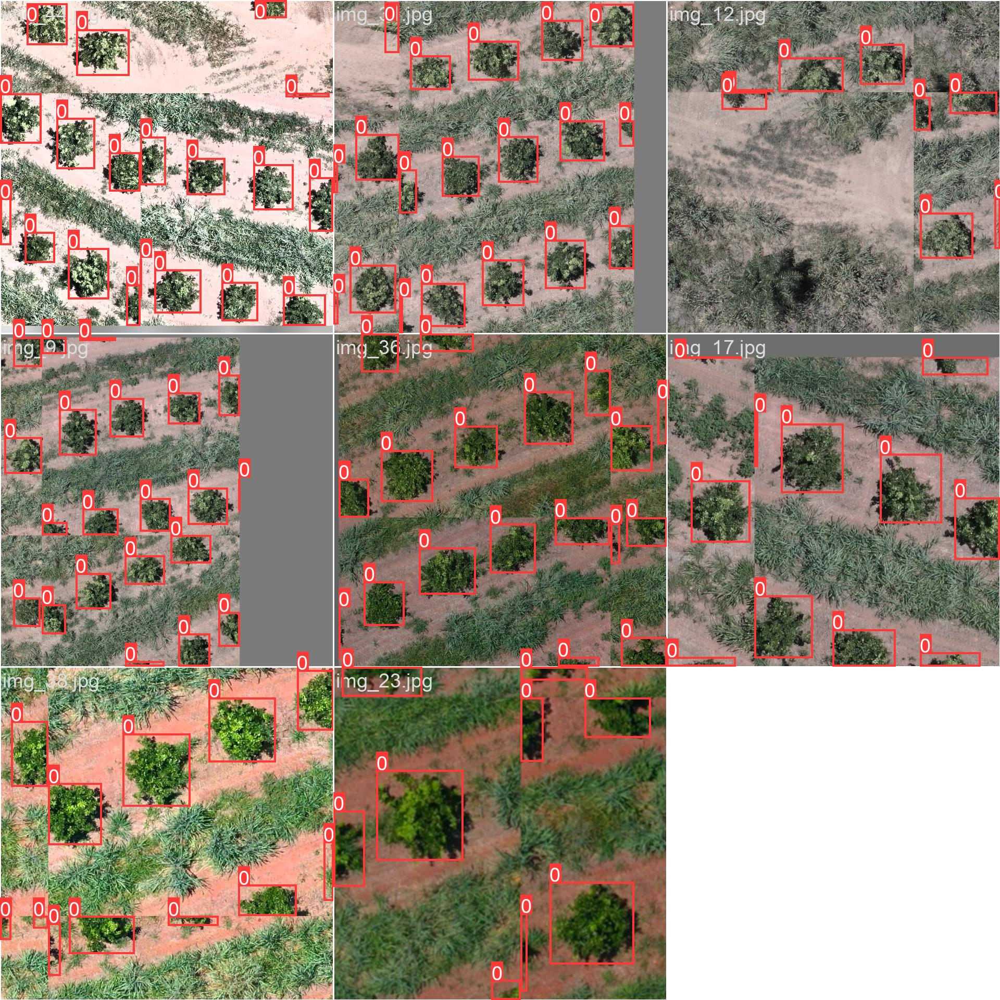

In [ ]:
Image(filename='/content/yolov5/runs/train/orangetree/train_batch1.jpg', width=900)

Então, vamos detectar laranjeiras em nossas imagens de validação:

In [ ]:
!python detect.py --source /content/validation --weight runs/train/orangetree/weights/best.pt

detect: weights=['runs/train/orangetree/weights/best.pt'], source=/content/validation, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-218-g9e97ac3 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
YOLOv5l summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/6 /content/validation/img_1.jpg: 640x640 10 Orange Trees, 12.5ms
image 2/6 /content/validation/img_14.jpg: 640x640 9 Orange Trees, 12.6ms
image 3/6 /content/validation/img_37.jpg: 640x640 9 Orange Trees, 12.6ms
image 4/6 /content/validation/img_47.jpg: 640x640 8 Orange Trees, 12.6ms
image 5/6 /cont

In [ ]:
print(sorted(os.listdir('/content/yolov5/runs/detect/exp')))

['img_1.jpg', 'img_14.jpg', 'img_37.jpg', 'img_47.jpg', 'img_5.jpg', 'img_57.jpg']


In [ ]:
for images in glob.glob('/content/yolov5/runs/detect/exp/*.jpg')[0:5]:
    display(Image(filename=images))

Também podemos dividir nossa imagem original em patches de 4096x4096, convertê-los em jpg e realizar a detecção e contar com essa imagem maior:

In [ ]:
img.shape

(5106, 15360, 3)

In [ ]:
img1 = img[0:4096,0:4096,0:3]
img2 = img[0:4096,4096:8192,0:3]
img3 = img[0:4096,8192:12228,0:3]

In [ ]:
%cd ..

/content


In [ ]:
!ls

drive  sample_data  train  train.csv  validation  validation.csv  yolov5


In [ ]:
!mkdir predict

In [ ]:
imsave('/content/predict/img1.jpg', img1)
imsave('/content/predict/img2.jpg', img2)
imsave('/content/predict/img3.jpg', img3)

In [ ]:
%cd yolov5

/content/yolov5


In [ ]:
!python detect.py --source /content/predict --img-size 4096 --weight runs/train/orangetree/weights/best.pt --save-txt

detect: weights=['runs/train/orangetree/weights/best.pt'], source=/content/predict, data=data/coco128.yaml, imgsz=[4096, 4096], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-218-g9e97ac3 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
YOLOv5l summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/3 /content/predict/img1.jpg: 4096x4096 120 Orange Trees, 301.8ms
image 2/3 /content/predict/img2.jpg: 4096x4096 125 Orange Trees, 302.1ms
image 3/3 /content/predict/img3.jpg: 4096x4064 130 Orange Trees, 307.1ms
Speed: 11.7ms pre-process, 303.6ms inference, 28.6ms NMS per image at shape (1, 3, 4096, 4

In [ ]:
for images in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg')[0:3]:
    display(Image(filename=images))

Referências:

https://towardsdatascience.com/evolution-of-yolo-yolo-version-1-afb8af302bd2

https://towardsdatascience.com/yolo-v3-object-detection-53fb7d3bfe6b